In [68]:
#Import Libraries

#This program solves a classification problem of predicting cancer type - malignant vs benign

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler




In [69]:
#Import data with brief description

path_to_file = "/Users/hunterpedersen/BMEN415/breast-cancer.csv"
bcData = pd.read_csv(path_to_file)
print(f'The dataset has {bcData.shape[0]} rows and {bcData.shape[1]} columns.')

The dataset has 569 rows and 32 columns.


In [70]:
#Preprocessing data check

bcData.dtypes #types of data
bcData.isna().sum() #check if any data is missing
bcData.duplicated().sum(0) #check duplicated rows
bcData.drop(columns='id', inplace= True) #remove id as it provides no info
labels = bcData['diagnosis'].value_counts().index.tolist()
values = np.round((bcData['diagnosis'].value_counts(normalize=True)*100), 1).to_list()

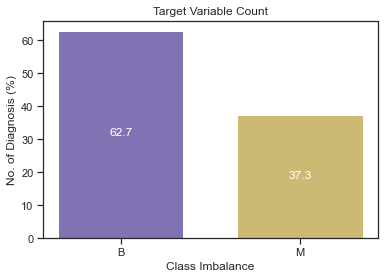

The benign cancers represent 62.7% of the cases
The malignant cancers represent 37.3% of the cases


In [71]:
#Creating the bar plot

plt.bar(labels, 
        values, 
        color = ['m', 'y'],
        width = 0.7)

plt.xlabel("Class Imbalance")
plt.ylabel("No. of Diagnosis (%)")
plt.title("Target Variable Count")

# add the value on each bar

for i in range(len(values)):
        plt.text(i, values[i]//2, values[i], ha='center', color='white')

plt.show() 

print(f'The benign cancers represent {values[0]}% of the cases')
print(f'The malignant cancers represent {values[1]}% of the cases')


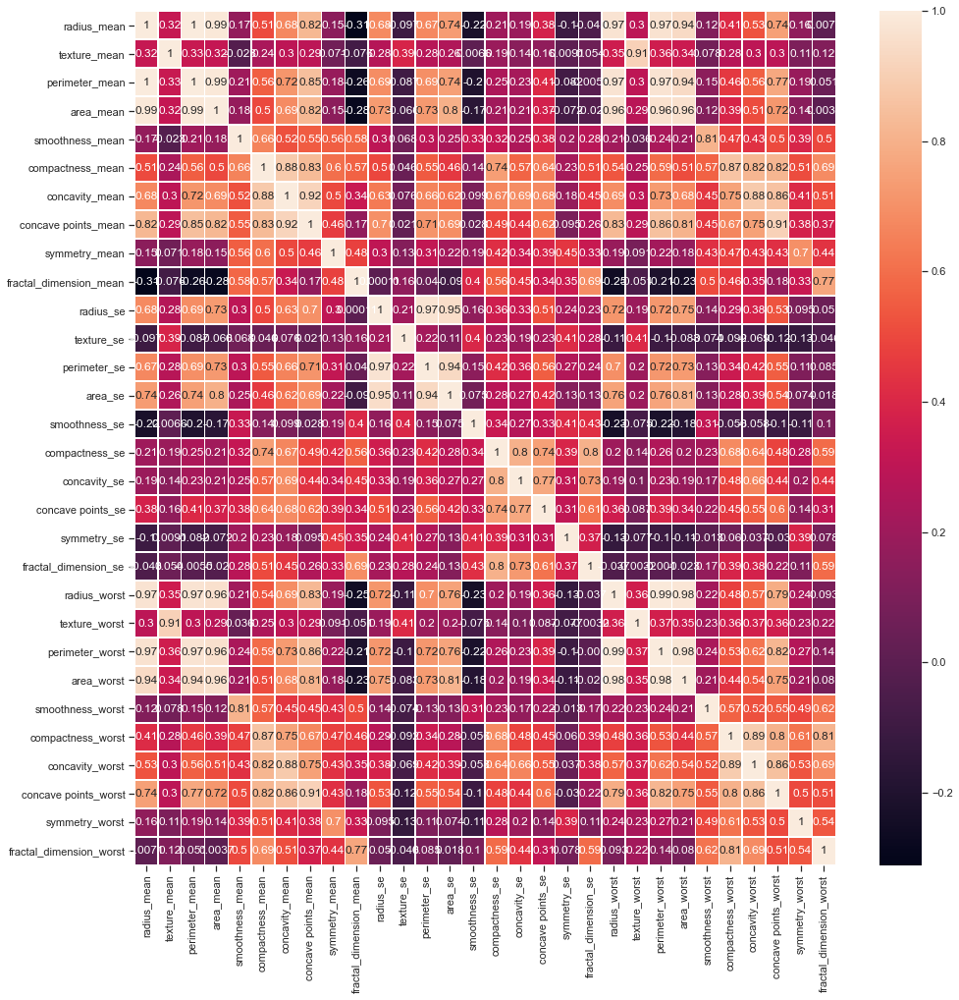

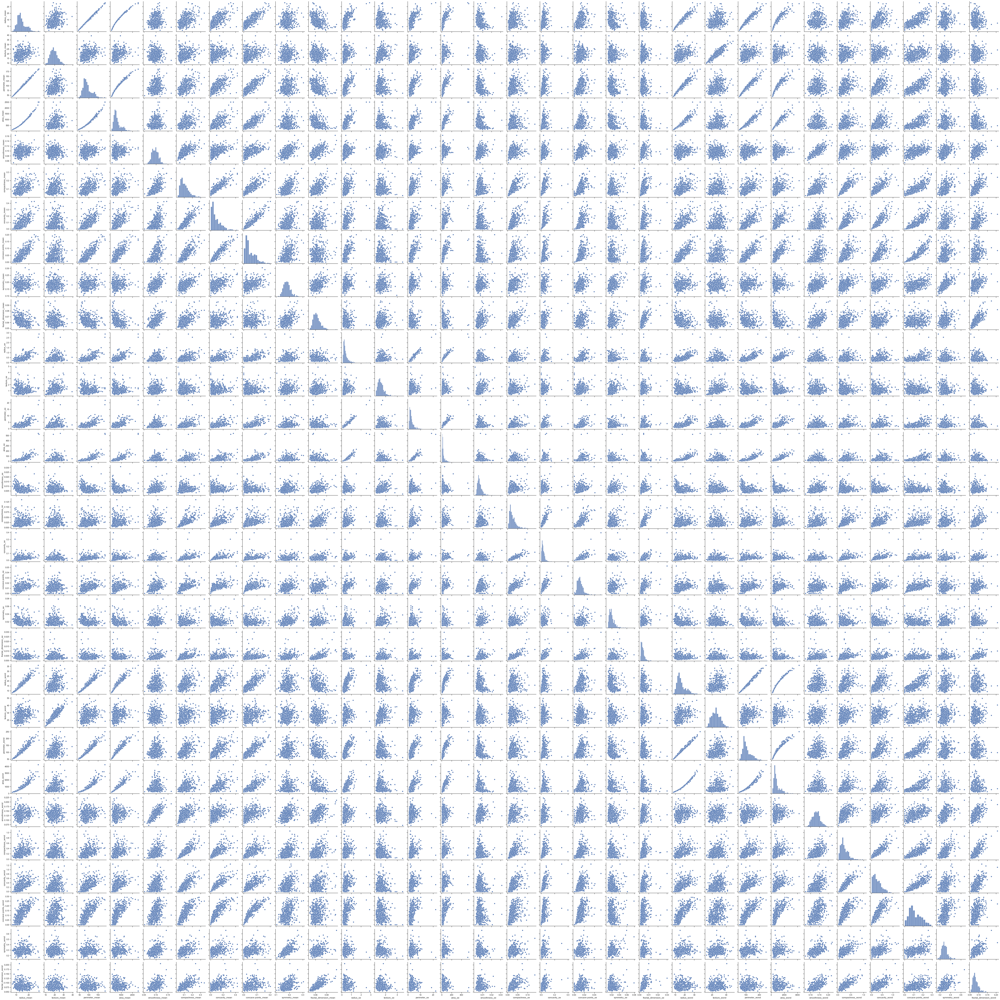

In [72]:
#Showcases initial data

#***Comment out this entire block of code to run program quickly without data visualizations***

fig, axs = plt.subplots(figsize = (16,16))
sns.heatmap(data = bcData.corr(), annot = True, linewidth = 0.5)
sns.set(style = "ticks", color_codes = True)
sns.pairplot(bcData)

plt.show()

In [102]:
#Import models 

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

In [103]:
bcData.head()




,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [104]:
#Drop diagnosis and predict on it

y = bcData.iloc[:,0]
x = bcData.drop(['diagnosis'], axis=1)
train, test = train_test_split(bcData)
x_train, x_test, y_train, y_test =train_test_split(x,y, random_state=42, test_size = 0.2)


In [105]:
#Logistic Regression

from sklearn import metrics

log_reg = LogisticRegression(max_iter=100000)
log_reg.fit(x_train, y_train)
y_pred = log_reg.predict(x_test)
accuracy = metrics.accuracy_score(y_test, y_pred)
accuracy

0.956140350877193

Text(89.18, 0.5, 'true value')

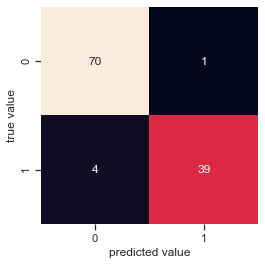

In [106]:
from sklearn.metrics import confusion_matrix

#Logistic Regression Confusion Matrix

mat = confusion_matrix(y_test, log_reg.predict(x_test))
sns.heatmap(mat, square=True, annot=True, cbar=False) 
plt.xlabel('predicted value')
plt.ylabel('true value')

In [107]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate

#Logistic Regression Scores

scores = cross_val_score(log_reg, x_train, y_train, cv=5)
scores
scores.mean()
scores = cross_validate(log_reg, x_train, y_train, cv=5, 
                        scoring='accuracy',
                       return_train_score=True)
scores
for label in [ 'train_score', 'test_score']:
    print('{}= {:.3f}'.format(label, scores[label].mean()))

log_reg.score(x_train, y_train)


train_score= 0.965
test_score= 0.954


0.9626373626373627

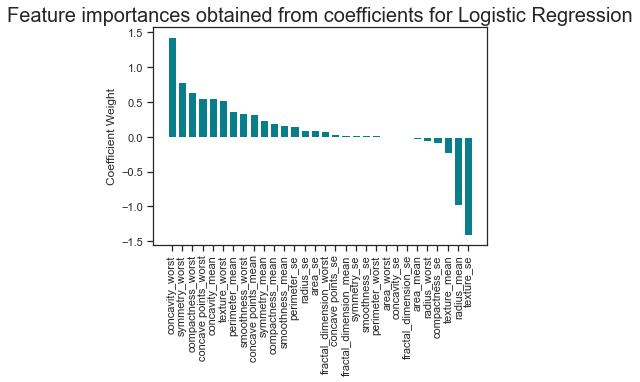

In [108]:
#Logistic Regression Importance

importances = pd.DataFrame(data={
    'Attribute': x_train.columns,
    'Importance': log_reg.coef_[0]})
importances = importances.sort_values(by='Importance', ascending=False)
plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients for Logistic Regression', size=20)
plt.ylabel('Coefficient Weight')
plt.xticks(rotation='vertical')
plt.show()

In [109]:
#Eliminating Features with low correlation 


Y = bcData['diagnosis'].values
X = bcData.drop(['diagnosis','area_worst','smoothness_se','concavity_se', 'radius_worst', 'area_mean', 'fractal_dimension_se', 'concave points_se', 'radius_se'], axis =1)


In [110]:
#Comparison of the Logistic Regression with preprocessing (new feature space)

X_train, X_test, Y_train, Y_test =train_test_split(X,y, random_state=42, test_size = 0.2)
log_reg2 = LogisticRegression(max_iter=100000)
log_reg2.fit(X_train, Y_train)
y_pred1 = log_reg2.predict(X_test)
accuracyPre = metrics.accuracy_score(Y_test, y_pred1)
accuracyPre

0.956140350877193

Text(89.18, 0.5, 'true value')

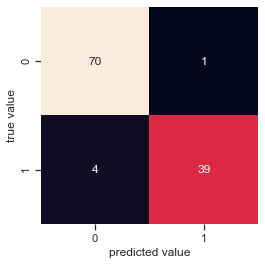

In [111]:
#Logistic Regression Confusion Matrix with Preprocessing

matpre = confusion_matrix(Y_test, log_reg2.predict(X_test))
sns.heatmap(matpre, square=True, annot=True, cbar=False) 
plt.xlabel('predicted value')
plt.ylabel('true value')

In [112]:
#Decision Tree 

Dec_Tree = DecisionTreeClassifier(random_state = 42)
Dec_Tree.fit(x_train, y_train)
y_pred = Dec_Tree.predict(x_test)
accuracy2= metrics.accuracy_score(y_test, y_pred)
accuracy2


0.9473684210526315

Text(89.18, 0.5, 'true value')

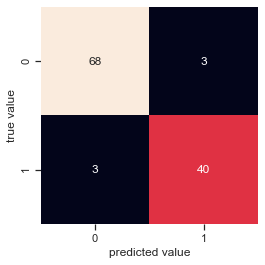

In [113]:
#Decision Tree Confusion Matrix

mat2 = confusion_matrix(y_test, Dec_Tree.predict(x_test))
sns.heatmap(mat2, square=True, annot=True, cbar=False)
plt.xlabel('predicted value')
plt.ylabel('true value')

In [114]:
#Decision Tree Scores

scores2 = cross_val_score(Dec_Tree, x_train, y_train, cv=5)
scores2
scores2.mean()
scores2 = cross_validate(Dec_Tree, x_train, y_train, cv=5, 
                        scoring='accuracy',
                       return_train_score=True)
scores2
for label in [ 'train_score', 'test_score']:
    print('{}= {:.3f}'.format(label, scores2[label].mean()))

Dec_Tree.score(x_train, y_train)


train_score= 1.000
test_score= 0.916


1.0

In [115]:
#Comparison of the Decision Tree with preprocessing (new feature space)

X_train, X_test, Y_train, Y_test =train_test_split(X,y, random_state=42, test_size = 0.2)
Dec_Tree2 = DecisionTreeClassifier()
Dec_Tree2.fit(X_train, Y_train)
y_pred2 = Dec_Tree2.predict(X_test)
accuracy2Pre = metrics.accuracy_score(Y_test, y_pred2)
accuracy2Pre

0.9210526315789473

Text(89.18, 0.5, 'true value')

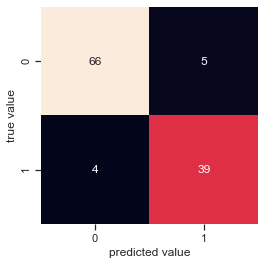

In [116]:
#Decision Tree Confusion Matrix with Preprocessing

mat2pre = confusion_matrix(Y_test, Dec_Tree2.predict(X_test))
sns.heatmap(mat2pre, square=True, annot=True, cbar=False)
plt.xlabel('predicted value')
plt.ylabel('true value')

In [117]:
#KNN

knn = KNeighborsClassifier()
knn.fit(x_train, y_train)
y_pred = knn.predict(x_test)
accuracy3 = metrics.accuracy_score(y_test, y_pred)
accuracy3

0.956140350877193

Text(89.18, 0.5, 'true value')

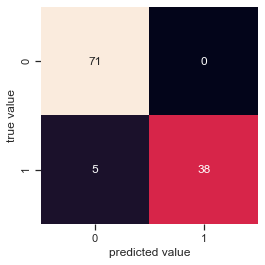

In [118]:
#KNN Confusion Matrix

mat3 = confusion_matrix(y_test, knn.predict(x_test))
sns.heatmap(mat3, square=True, annot=True, cbar=False) 
plt.xlabel('predicted value')
plt.ylabel('true value')

In [119]:
#KNN Scores

scores3 = cross_val_score(knn, x_train, y_train, cv=5)
scores3
scores3.mean()
scores3 = cross_validate(knn, x_train, y_train, cv=5, 
                        scoring='accuracy',
                       return_train_score=True)
scores3
for label in [ 'train_score', 'test_score']:
    print('{}= {:.3f}'.format(label, scores3[label].mean()))

knn.score(x_train, y_train)


train_score= 0.937
test_score= 0.923


0.9406593406593406

In [120]:
#Comparison of the KNN with preprocessing (new feature space)

X_train, X_test, Y_train, Y_test =train_test_split(X,y, random_state=42, test_size = 0.2)
knn2 = KNeighborsClassifier()
knn2.fit(X_train, Y_train)
y_pred3 = knn2.predict(X_test)
accuracy3Pre = metrics.accuracy_score(Y_test, y_pred3)
accuracy3Pre

0.9736842105263158

Text(89.18, 0.5, 'true value')

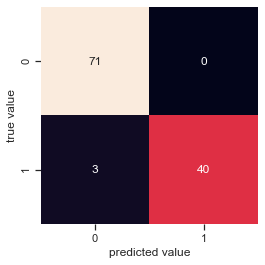

In [121]:
#KNN Confusion Matrix with Preprocessing

mat3pre = confusion_matrix(Y_test, knn2.predict(X_test))
sns.heatmap(mat3pre, square=True, annot=True, cbar=False)
plt.xlabel('predicted value')
plt.ylabel('true value')

In [122]:
#summarize the results

#Logistic Regression


print('Logistic Regression training accuracy (all data) {:.3f}'.format(log_reg.score(x_train, y_train)))

print('Logistic Regression training accuracy (cross-validation) {:.3f}'.format(scores['train_score'].mean()))

print('Logistic Regression validation accuracy (cross-validation) {:.3f}'.format(scores['test_score'].mean()))

print('Logistic Regression test accuracy (new data) {:.3f}'.format(log_reg.score(x_test, y_test)))

print('Logistic Regression test accuracy with preprocessing (new data) {:.3f}'.format(log_reg2.score(X_test, Y_test)))

#Decision Tree

print('Decision Tree training accuracy (all data) {:.3f}'.format(Dec_Tree.score(x_train, y_train)))

print('Decision Tree training accuracy (cross-validation) {:.3f}'.format(scores2['train_score'].mean()))

print('Decision Tree validation accuracy (cross-validation) {:.3f}'.format(scores2['test_score'].mean()))

print('Decision Tree test accuracy (new data) {:.3f}'.format(Dec_Tree.score(x_test, y_test)))

print('Decision Tree test accuracy with preprocessing (new data) {:.3f}'.format(Dec_Tree2.score(X_test, Y_test)))

#KNN

print('KNN training accuracy (all data) {:.3f}'.format(knn.score(x_train, y_train)))

print('KNN training accuracy (cross-validation) {:.3f}'.format(scores3['train_score'].mean()))

print('KNN validation accuracy (cross-validation) {:.3f}'.format(scores3['test_score'].mean()))

print('KNN test accuracy (new data) {:.3f}'.format(knn.score(x_test, y_test)))

print('KNN test accuracy with preprocessing (new data) {:.3f}'.format(knn2.score(X_test, Y_test)))

Logistic Regression training accuracy (all data) 0.963
Logistic Regression training accuracy (cross-validation) 0.965
Logistic Regression validation accuracy (cross-validation) 0.954
Logistic Regression test accuracy (new data) 0.956
Logistic Regression test accuracy with preprocessing (new data) 0.956
Decision Tree training accuracy (all data) 1.000
Decision Tree training accuracy (cross-validation) 1.000
Decision Tree validation accuracy (cross-validation) 0.916
Decision Tree test accuracy (new data) 0.947
Decision Tree test accuracy with preprocessing (new data) 0.921
KNN training accuracy (all data) 0.941
KNN training accuracy (cross-validation) 0.937
KNN validation accuracy (cross-validation) 0.923
KNN test accuracy (new data) 0.956
KNN test accuracy with preprocessing (new data) 0.974
